# Proyecto final de Audio

In [1]:
from google.colab import userdata

fpath = '/content/audiopfinal/data'


token = userdata.get('ghToken')
!git clone https://{token}@github.com/Cosuki/audiopfinal.git > /dev/null 2>&1

import pandas as pd
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from scipy import io, signal
from scipy.io.wavfile import read
from IPython.display import Audio
import scipy.io.wavfile as wav
from matplotlib.pyplot import specgram
from scipy.signal import spectrogram

def pltlegacy(ax, title, xLabel, yLabel):
  if type(ax) == np.ndarray or type(ax) == plt.Axes:
    ax.set_title(title)
    # ax.set_ylim(top=10000)
    ax.set_xlabel(xLabel)
    ax.set_ylabel(yLabel)
    if not yLabel: ax.get_yaxis().set_visible(False)
    # if not xLabel: ax.get_xaxis().set_visible(False)
  else:
    ax.title(title)
    # ax.set_ylim(top=10000)
    ax.xlabel(xLabel)
    ax.ylabel(yLabel)

def getpltmtplt(ax, key, data, sr, xLabel, yLabel):
    Pxx, freqs, bins, im = ax.specgram(data, NFFT=1024, Fs=sr, noverlap=128, cmap='viridis')
    pltlegacy(ax, f'{key}', xLabel, yLabel)
    return Pxx, freqs, bins, im

def getSpecSig(ax, key, data, sr, xLabel, yLabel):
  f, t_spec, Sxx = spectrogram(data, sr)
  Sxx += 1e-10
  pltlegacy(ax, f'{key}', xLabel, yLabel)
  return ax.pcolormesh(t_spec, f, 10 * np.log10(Sxx), shading='gouraud')

In [2]:
srG, guitar = io.wavfile.read(f'{fpath}/Police-vocals-guitar.wav')
srV, voice = io.wavfile.read(f'{fpath}/Emily_Linge-vocals.wav')

print(f'{srG=}, {srV=}')

guitar = guitar[0: 60*srG]
voice = voice[0: 60*srV]

display(Audio(guitar, rate=srG), Audio(voice, rate=srV))

srG=22050, srV=22050


In [42]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

def yin_pitch(audio, sr, fmin=50, fmax=2000):
    """Pitch detection using the Yin algorithm from librosa."""
    pitches, _, _ = librosa.pyin(audio, fmin=fmin, fmax=fmax, sr=sr)
    return pitches

def compare_algorithms(audio, sr, sIni, sEnd, plot_waveform=False):
    """
    Compare pitch detection algorithms within a specified time range.

    Parameters:
        audio (np.ndarray): The audio signal.
        sr (int): The sampling rate of the audio signal.
        sIni (float): The start time in seconds.
        sEnd (float): The end time in seconds.
        plot_waveform (bool): Whether to include the waveform in the plot.
    """
    # Extract the audio segment
    start_sample = int(sIni * sr)
    end_sample = int(sEnd * sr)
    audio_segment = audio[start_sample:end_sample]

    # Compute pitches
    yin_pitches = yin_pitch(audio_segment, sr)

    # Generate time axis for plotting
    duration = sEnd - sIni
    hop_length = 512  # Ensure hop_length matches the one used in algorithms
    times = np.linspace(sIni, sEnd, len(yin_pitches))  # Adjusted to match the time interval


    f0_interpolated = np.nan_to_num(yin_pitches)
    # f0_interpolated[np.argwhere(f0_interpolated < 100)] = 0

    # Plot the results
    plt.figure(figsize=(12, 8))
    plt.plot(times, f0_interpolated, label='Yin Algorithm', alpha=0.8)
    # Optionally overlay the waveform
    if plot_waveform:
        waveform_times = np.linspace(sIni, sEnd, len(audio_segment))
        plt.plot(waveform_times, (abs(audio_segment)/max(audio_segment))*500, label='Audio Waveform', alpha=0.3, color='gray')

    plt.xlabel('Time (s)')
    plt.ylabel('Pitch (Hz)')
    plt.title(f'Comparison of Pitch Detection Algorithms ({sIni}s to {sEnd}s)')
    plt.legend()
    plt.show()

    return f0_interpolated


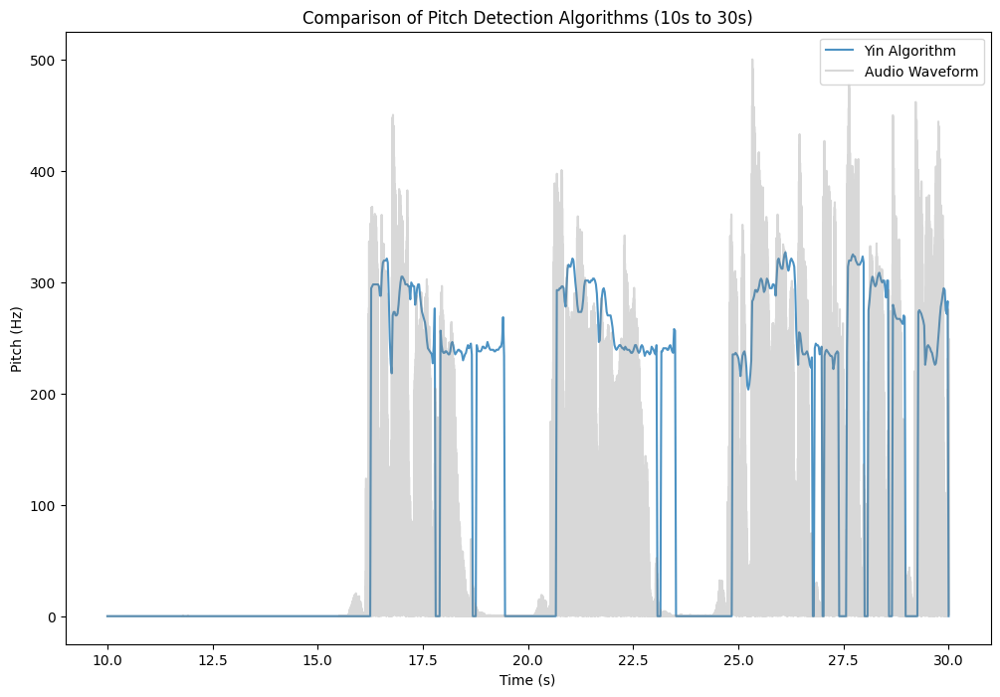

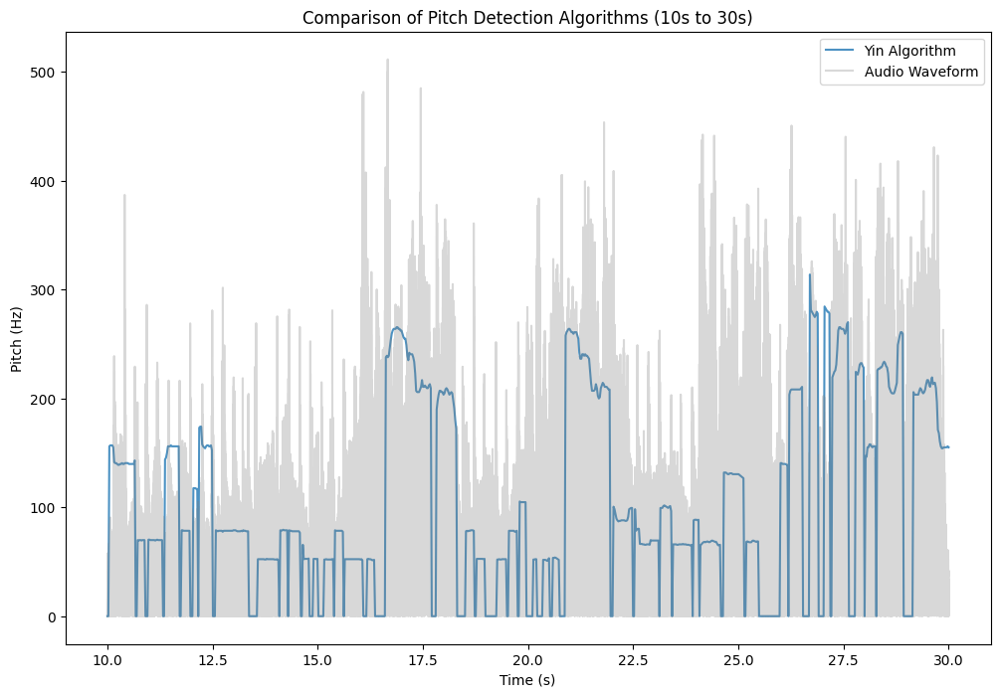

In [43]:
pitchVoice = compare_algorithms(voice, srV, 10, 30, True)

pitchGuitar = compare_algorithms(guitar, srG, 10, 30, True)

In [44]:
def obtener_notas(ref=440, Ndown=24, Nup=24):
    # Devuelve array con Ndown notas anteriores a ref (estimación de A4) y Nup notas posteriores
    # Valores por defecto para ir de A2 a A6 con referencia A4 puro

    notas = np.zeros(Ndown+Nup+1)
    A4 = Ndown
    notas[A4] = ref

    for i in range(Ndown):
        notas[A4-i-1] = notas[A4-i]*2**(-1/12)
    for i in range(Nup):
        notas[A4+i+1] = notas[A4+i]*2**(1/12)

    return notas

def distancia_notas(notas, ff):
    N = len(ff)
    distancias = np.zeros(N)
    distancias_indmin = np.zeros(N, dtype=int)

    for i in range(N):
        if ff[i]==0:
            distancias[i] = np.inf
            distancias_indmin[i] = -1
        else:
            distancias_indmin[i] = np.argmin(np.abs(12*np.log2(ff[i]/notas)))
            distancias[i] = 12*np.log2(ff[i]/notas[distancias_indmin[i]])

    return distancias, distancias_indmin

def desviacion_A4(distancias):

    desviacion_media = np.mean(distancias[np.isfinite(distancias)])
    desviacion_mediana = np.median(distancias[np.isfinite(distancias)])

    return desviacion_media, desviacion_mediana

def estandarizar_notas(notas, indices):

    N = len(indices)
    notas_estandar = np.zeros(N)

    for i in range(N):
        if indices[i] == -1:
            notas_estandar[i] = 0
        else:
            notas_estandar[i] = notas[indices[i]]

    return notas_estandar

In [46]:
notas = obtener_notas()
emily_dist, emily_dist_indmin = distancia_notas(notas, pitchVoice)
voiceNorm = estandarizar_notas(notas, emily_dist_indmin)
police_dist, police_dist_indmin = distancia_notas(notas, pitchGuitar)
guitarNorm = estandarizar_notas(notas, police_dist_indmin)

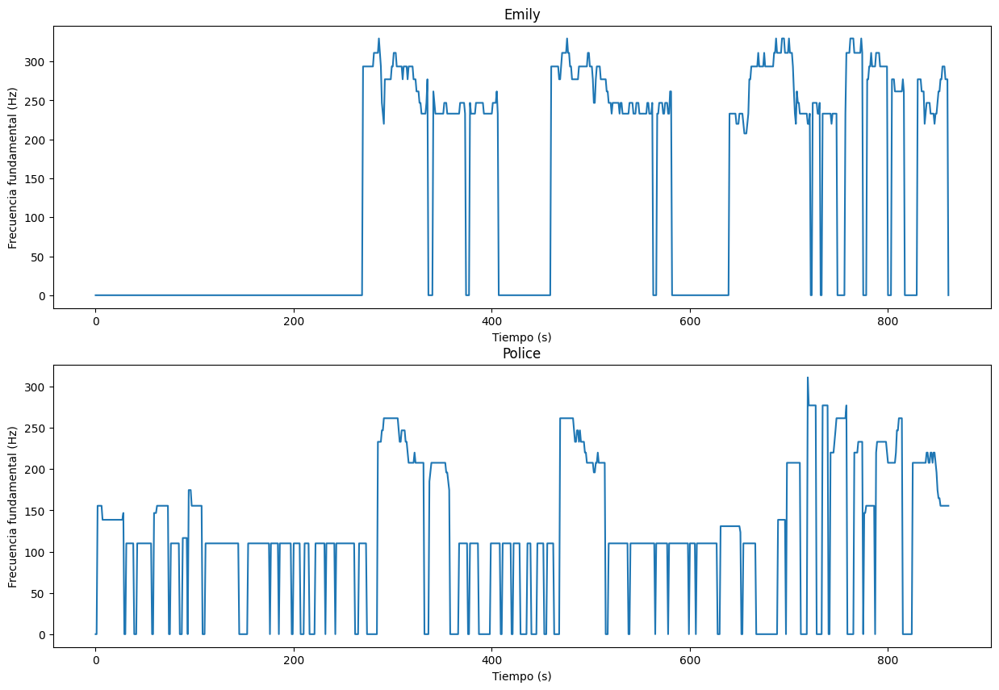

In [47]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15,10))
axs[0].plot(voiceNorm)
axs[0].set_title('Emily')
axs[0].set_xlabel('Tiempo (s)')
axs[0].set_ylabel('Frecuencia fundamental (Hz)')
axs[1].plot(guitarNorm)
axs[1].set_title('Police')
axs[1].set_xlabel('Tiempo (s)')
axs[1].set_ylabel('Frecuencia fundamental (Hz)')
plt.show()

In [8]:
# Instalar las bibliotecas necesarias
!pip install fastdtw dtaidistance matplotlib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 40.2 MB/s eta 0:00:00
  Created wheel for fastdtw: filename=fastdtw-0.3.4-cp310-cp310-linux_x86_64.whl size=512551 sha256=c5963c7f3f8bd43d3edcc712619bed66ea6f9f5eb23724e47470cc1c4fd0d833
  Stored in directory: /root/.cache/pip/wheels/73/c8/f7/c25448dab74c3acf4848bc25d513c736bb93910277e1528ef4
Successfully built fastdtw


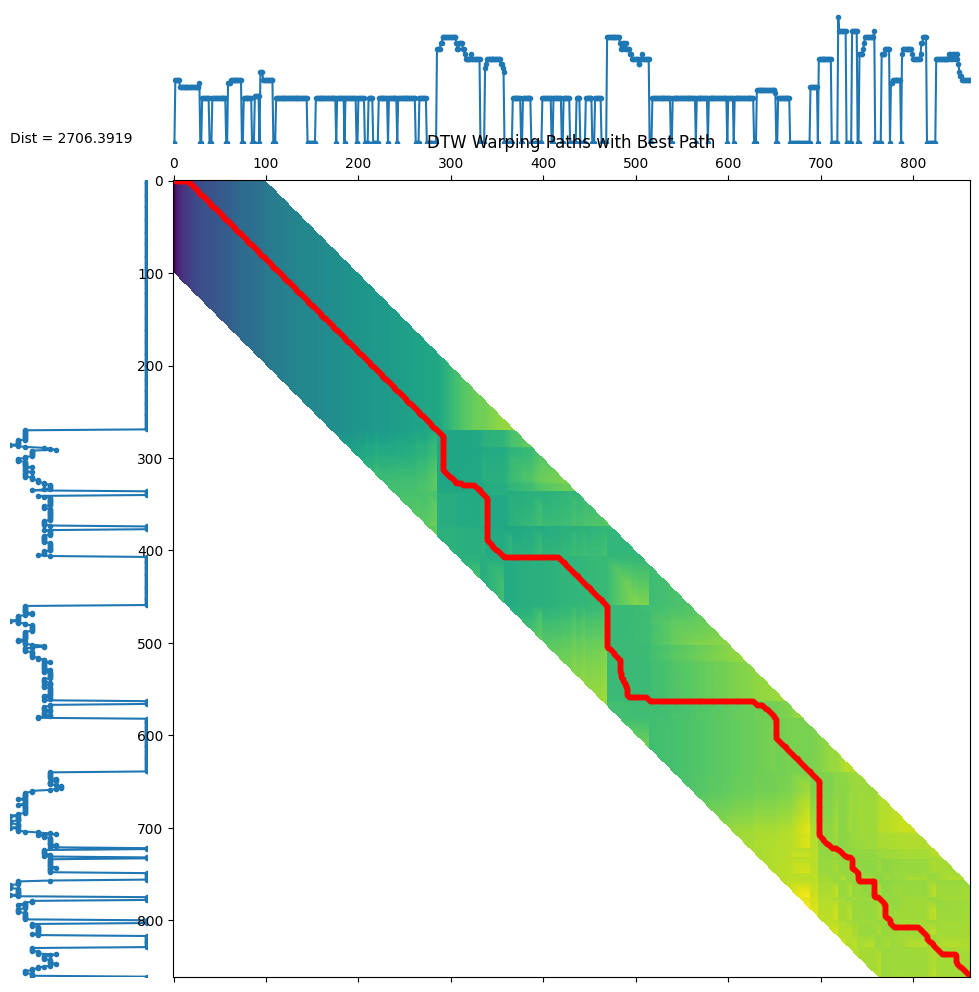

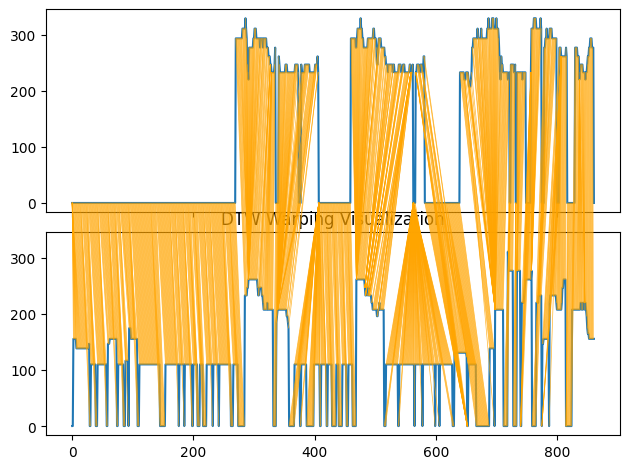

In [48]:

import numpy as np
import matplotlib.pyplot as plt
from fastdtw import fastdtw
from dtaidistance import dtw, dtw_visualisation as dtwvis

# Calcular la matriz de caminos y encontrar el mejor camino con restricciones
window = 100  # Ventana de restricción
psi = 2      # Tolerancia en los extremos
d, paths = dtw.warping_paths(voiceNorm, guitarNorm, window=window, psi=psi)
best_path = dtw.best_path(paths)

# Visualizar las warping paths y el mejor camino
dtwvis.plot_warpingpaths(voiceNorm, guitarNorm, paths, best_path)
plt.title("DTW Warping Paths with Best Path")
plt.show()

# Visualizar las secuencias con el camino óptimo
dtwvis.plot_warping(voiceNorm, guitarNorm, best_path)
plt.title("DTW Warping Visualization")
plt.show()

In [ ]:
import numpy as np
from scipy.interpolate import interp1d
import librosa
from IPython.display import Audio

def stretch_or_compress(signal, best_path):
    """
    Estira o comprime una señal según la asociación de índices en best_path.

    Args:
        signal (numpy.ndarray): La señal de audio a modificar.
        best_path (list of tuples): Asociación de índices entre dos señales.

    Returns:
        numpy.ndarray: La señal estirada o comprimida.
    """
    # Extraer los índices originales y asociados
    original_indices, mapped_indices = zip(*best_path)

    # Eliminar duplicados en los índices mapeados para evitar ambigüedades
    unique_indices = np.unique(mapped_indices, return_index=True)[1]
    mapped_indices = np.array(mapped_indices)[unique_indices]
    original_indices = np.array(original_indices)[unique_indices]

    # Crear una interpolación para alinear la señal
    interpolation = interp1d(original_indices, signal[mapped_indices], kind="linear", fill_value="extrapolate")

    # Generar la nueva señal alineada
    aligned_signal = interpolation(np.arange(len(signal)))
    return aligned_signal



In [28]:
k = 0

for i, j in best_path:
  if best_path[k][0] == best_path[k-1][0] and best_path[k][1] == best_path[k+1][1]:
    print(k)
  if best_path[k][1] == best_path[k-1][1] and best_path[k][0] == best_path[k+1][0]:
    print(k)
  k += 1

In [ ]:
from scipy.signal import resample, resample_poly

iCont = 0
iAnt = 10
jCont = 0
jAnt = 10

voiceBestPath, guitarBestPath = zip(*best_path)

print(voiceBestPath)
print(guitarBestPath)

voicePitchFrac = len(voice)//len(voiceNorm)
guitarPitchFrac = len(guitar)//len(guitarNorm)

voiceSync = []
guitarSync = []
iAuxArr = []
jAuxArr = []

for i, j in best_path:
  print(i,j, iAnt, jAnt, i == iAnt, j == jAnt)
  if i == iAnt:
    iAuxArr.extend(guitar[(j-1) * guitarPitchFrac: (j) * guitarPitchFrac])
  else:
    iAuxArr.extend(guitar[(j-1) * guitarPitchFrac: (j) * guitarPitchFrac])
    guitarSync.extend(resample(iAuxArr, voicePitchFrac))
    iAuxArr = []

  iAnt = i


  if j == jAnt:
    jAuxArr.extend(voice[(i-1) * voicePitchFrac: (i) * voicePitchFrac])
  else:
    jAuxArr.extend(voice[(i-1) * voicePitchFrac: (i) * voicePitchFrac])
    print((i-1) * voicePitchFrac, (i) * voicePitchFrac)
    a = resample(jAuxArr, guitarPitchFrac)
    print(a)
    voiceSync.extend(a)
    jAuxArr = []

  jAnt = i




In [49]:
NOREP = 0
REPE = 1
REPP = 2

estado = NOREP

emily_sync = []

e, p = zip(*best_path)

chunkSamples = len(voice)//len(voiceNorm)

def concateno(base, nuevo):
  return base.extend(nuevo)

def extender(sig, index, samples):
  return signal.resample(sig[index*chunkSamples:(index+1)*chunkSamples], samples*chunkSamples)

def comprimir(sig, iIni, iEnd):
  return signal.resample(sig[iIni*chunkSamples:iEnd*chunkSamples], chunkSamples)

for i in range(len(best_path)-1):
  if estado == NOREP:
    if e[i] == e[i+1]:
      estado = REPE
      Re = 2
      indicei = e[i]
    if p[i] == p[i+1]:
      estado = REPP
      indicei = p[i]
    else:
      concateno(emily_sync, voice[e[i]*chunkSamples:(e[i]+1)*chunkSamples])
  elif estado == REPE:
    if e[i] == e[i+1]:
      Re += 1
    else:
      ext = extender(voice, indicei, Re)
      concateno(emily_sync, ext)
      estado = NOREP
  elif estado == REPP:
    if p[i] != p[i+1]:
      comp = comprimir(voice, indicei, p[i+1])
      concateno(emily_sync, comp)
      estado = NOREP


In [50]:
print(len(guitar), len(emily_sync))

suma = emily_sync[:len(guitar)] + guitar

display(Audio(suma, rate=srV))


1323000 1339182
